<a href="https://colab.research.google.com/github/GergelyTuri/context-project/blob/main/notebooks/Copy_of_colocalizaton_dual_3_5_24_GT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analyzing RNAsocpe colocalization
* 12/1/2023
* troubleshooting and making it interactive --GT

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import base64
from io import BytesIO
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import plot
from PIL import Image

# Ensure plots are rendered within the notebook
import pandas as pd
import xml.etree.ElementTree as ET
import seaborn as sns
import numpy as np
from scipy.spatial.distance import cdist
from os.path import join, dirname


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def parse_xml(xml_file_path: str) -> pd.DataFrame:
  tree = ET.parse(xml_file_path)
  root = tree.getroot()

  # Create lists to store data
  types = []
  marker_x_values = []
  marker_y_values = []

  # Iterate through Marker elements
  for marker_type in root.findall('.//Marker_Type'):
      current_type = marker_type.find('Type').text
      for marker in marker_type.findall('.//Marker'):
          marker_x = marker.find('MarkerX').text
          marker_y = marker.find('MarkerY').text

          # Append data to lists
          types.append(current_type)
          marker_x_values.append(marker_x)
          marker_y_values.append(marker_y)

  # Create a DataFrame
  data = {'Type': types, 'MarkerX': marker_x_values, 'MarkerY': marker_y_values}
  df = pd.DataFrame(data)

  # Display the DataFrame
  return df

In [ ]:
def calc_pairwise_dist(dataframe: pd.DataFrame):
    """
    Calculate and return the pairwise distances between points of Type 1 and their closest points of Type 2.

    Parameters:
    - dataframe (pd.DataFrame): The input DataFrame with columns 'Type', 'MarkerX', and 'MarkerY'.

    Returns:
    - pd.DataFrame: A DataFrame with the coordinates of each Type 1 point, its closest Type 2 point,
                    and the distance between them.
    """
    # Filter and select coordinates based on 'Type', converting directly to int
    type1_df = dataframe.loc[dataframe['Type'] == '1', ['MarkerX', 'MarkerY']].astype(int)
    type2_df = dataframe.loc[dataframe['Type'] == '2', ['MarkerX', 'MarkerY']].astype(int)

    # Calculate pairwise distances
    distances_matrix = cdist(type1_df.values, type2_df.values)

    # Find the closest Type 2 point for each Type 1 point
    closest_indices = np.argmin(distances_matrix, axis=1)

    # Create a new DataFrame with Type 1 and closest Type 2 coordinates
    df_closest = pd.DataFrame({
        'Type1_MarkerX': type1_df['MarkerX'].values,
        'Type1_MarkerY': type1_df['MarkerY'].values,
        'Type2_MarkerX': type2_df.iloc[closest_indices, 0].values,
        'Type2_MarkerY': type2_df.iloc[closest_indices, 1].values,
    })

    # Calculate distances and add a new column
    df_closest['Distance'] = np.sqrt(np.sum((df_closest[['Type1_MarkerX', 'Type1_MarkerY']].values -
                                             df_closest[['Type2_MarkerX', 'Type2_MarkerY']].values) ** 2, axis=1))

    return df_closest

In [ ]:
def plot_distances(dataframe: pd.DataFrame, distance: float=15.0, ax=None, image_path=None):
    """
    Plots distances on a given axis 'ax' over an optional background image specified by 'image_path'.
    """
    if ax is None:
        fig, ax = plt.subplots()

    # If an image path is provided, display the image first
    if image_path:
        image = mpimg.imread(image_path)
        ax.imshow(image)
        ax.axis('off')  # Optionally hide the axis

    df_filtered = dataframe[dataframe['Distance'] < distance]
    columns_to_convert = ['Type1_MarkerX', 'Type1_MarkerY', 'Type2_MarkerX', 'Type2_MarkerY']
    df_filtered[columns_to_convert] = df_filtered[columns_to_convert].astype(float)

    # Create a scatter plot over the image with empty circle markers
    sns.scatterplot(x='Type1_MarkerX', y='Type1_MarkerY', data=df_filtered, ax=ax,
                    marker='o', facecolors='none', edgecolors='k')

    return ax

In [ ]:
# filelocation="/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/dual_10_13_23/series_1/Cellcounter_dual_10_13_23_series1.xml"
files = [
        # "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/dual_10_13_23/series_9/CellCounter_xml_series9.xml",
       #  "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/dual_10_13_23/series_1/Cellcounter_dual_10_13_23_series1.xml",
       #  "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/dual_10_13_23/series_9/CellCounter_xml_series9.xml",
         #  "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/dual_10_13_23/series_10/Cellcounter_dual_10_13_23_series10.xml",
       #   "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/3_dual_10_27_23/series_4/CellCounter_xml_series4.xml",
       #    "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/2_dual_10_27_23/series_13/CellCounter_xml_series 13.xml",
        #   "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/2_dual_10_27_23/series_14/CellCounter_xml_series14.xml",
       #    "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/2_dual_10_27_23/series_15/CellCounter_xml_series15.xml",
        #   "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/2_dual_10_27_23/series_16/CellCounter_xml_series16.xml",
        #   "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/1_dual_10_27_23/series_11/CellCounter_xml_series11.xml",
           "/content/drive/Shareddrives/Turi_lab/Data/psilocybin_project/Stephanies/analysis/date/1_dual_10_27_23/series_14/CellCounter_xml_series14.xml",
         ]

In [ ]:
# for xml_file in files:
#   print(f'File name {xml_file}')
#   parsed_df = parse_xml(xml_file)
#   to_plot = calc_pairwise_dist(parsed_df)
#   plot_distances(to_plot, xml_file)

<ipython-input-4-2f806420f199>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[columns_to_convert] = df_filtered[columns_to_convert].astype(float)


<Axes: xlabel='Type1_MarkerX', ylabel='Type1_MarkerY'>

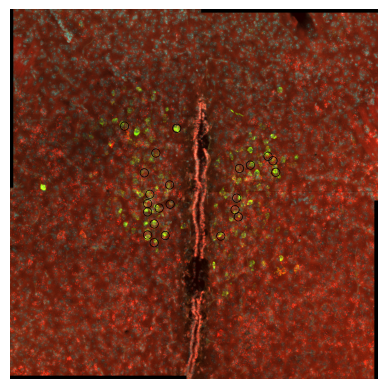

In [ ]:
data = parse_xml(files[0])
pairwise_dist = calc_pairwise_dist(data)
image_path = join(dirname(files[0]), 'CounterWindowComposite_series14png.png')
plot_distances(pairwise_dist, image_path=image_path )

In [ ]:
img = Image.open(image_path)

# Downsample the image by reducing its size
# Let's say we reduce its width and height by half for this example
downsampled_img = img.resize((int(img.width / 2), int(img.height / 2)))

buffered = BytesIO()
downsampled_img.save(buffered, format="PNG")
img_str = base64.b64encode(buffered.getvalue()).decode()
data_uri = "data:image/png;base64," + img_str

# If you need to convert the downsampled image to a NumPy array for Plotly
# downsampled_img_np = np.array(downsampled_img)

In [ ]:
# Create your plotly figure
fig = go.Figure()

# Assuming you have your data for the scatter plot ready
# Add your scatter plot data here...

# Add the downsampled image as a background
fig.add_layout_image(
    dict(
        source=data_uri,
        xref="x",
        yref="y",
        x=0,
        y=0,
        sizex=img.width,  # Use the original image width for display size
        sizey=img.height,  # Use the original image height for display size
        sizing="contain",
        opacity=1.0,
        layer="below")
)

# Set the plot bounds to fit the original image dimensions
# Set axes to match the image size
fig.update_xaxes(showline=False, showgrid=False, visible=False,
                 range=[0, downsampled_img.width])
fig.update_yaxes(showline=False, showgrid=False, visible=False,
                 range=[0, downsampled_img.height],
                 scaleanchor="x", scaleratio=1,
                 autorange="reversed")

fig.show()


In [ ]:
def plot_distances_plotly(dataframe: pd.DataFrame, distance: float=15.0, image_path=None):
    df_filtered = dataframe[dataframe['Distance'] < distance]
    columns_to_convert = ['Type1_MarkerX', 'Type1_MarkerY', 'Type2_MarkerX', 'Type2_MarkerY']
    df_filtered[columns_to_convert] = df_filtered[columns_to_convert].astype(float)

    # Initialize the figure
    fig = go.Figure()

    # If an image path is provided, display the image as the background
    if image_path:
        img = Image.open(image_path)
        # Convert the image to a data URI
        buffered = BytesIO()
        img.save(buffered, format="PNG")
        img_str = base64.b64encode(buffered.getvalue()).decode()
        data_uri = "data:image/png;base64," + img_str
        # Add the image to the figure
        fig.add_layout_image(
            dict(
                source=data_uri,
                xref="x",
                yref="y",
                x=0,
                y=0,
                sizex=img.width,
                sizey=img.height,
                sizing="stretch",
                opacity=1.0,
                layer="below"
            )
        )
        # Update axes to match the image dimensions
        fig.update_xaxes(range=[0, img.width], showline=False, showgrid=False, visible=False)
        fig.update_yaxes(range=[0, img.height], showline=False, showgrid=False, visible=False, autorange="reversed")

    # Add the scatter plot
    fig.add_trace(go.Scatter(
        x=df_filtered['Type1_MarkerX'],
        y=df_filtered['Type1_MarkerY'],
        mode='markers',
        marker=dict(
            size=10,
            color='black',  # Adjust color as needed
            opacity=1,
            symbol='circle-open'
        ),
        name='Distances'
    ))

    # Show the figure
    return fig


In [ ]:
fig = plot_distances_plotly(pairwise_dist, image_path=image_path)

<ipython-input-43-c2f72fbdf653>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig.show()